In [474]:
import seisbench.data as sbd
import seisbench.generate as sbg
import seisbench.models as sbm
from seisbench.util import worker_seeding
import os
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from obspy.clients.fdsn import Client
from obspy import UTCDateTime
from torchsummary import summary
import pandas as pd
from collections import Counter
from torch.utils.tensorboard import SummaryWriter
writer = SummaryWriter('runs/phasenet')
import torchvision

In [475]:
seed =56
torch.backends.cudnn.deterministic= True
torch.backends.cudnn.benchmark= False
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)

In [476]:
model = sbm.PhaseNet.from_pretrained("instance")
model.cuda();

In [477]:
def remove_softmax(model):
    for child_name, child in model.named_children():
        if isinstance(child, nn.Softmax):
            setattr(model, child_name, nn.Identity())
        else:
            remove_softmax(child)

new = remove_softmax(model)
print(model)

Component order:	ZNE
SeisBench model		PhaseNet

PhaseNet(
  (inc): Conv1d(3, 8, kernel_size=(1,), stride=(1,))
  (in_bn): BatchNorm1d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv1): Conv1dSame(
    (conv): Conv1d(8, 11, kernel_size=(7,), stride=(4,), padding=(3,))
  )
  (bnd1): BatchNorm1d(11, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv2): Conv1dSame(
    (conv): Conv1d(11, 16, kernel_size=(7,), stride=(4,), padding=(3,))
  )
  (bnd2): BatchNorm1d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv3): Conv1dSame(
    (conv): Conv1d(16, 22, kernel_size=(7,), stride=(4,), padding=(3,))
  )
  (bnd3): BatchNorm1d(22, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv4): Conv1dSame(
    (conv): Conv1d(22, 32, kernel_size=(7,), stride=(4,), padding=(3,))
  )
  (bnd4): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (up1): ConvTranspose1d(32, 22, kernel_size

In [478]:
data = sbd.Iquique(sampling_rate=100)
#data = sbd.ETHZ(sampling_rate=100)
train, dev, test = data.train_dev_test()

2022-10-16 19:45:05,225 | seisbench | WARNING | Check available storage and memory before downloading and general use of Iquique dataset. Dataset size: waveforms.hdf5 ~5Gb, metadata.csv ~2.6Mb


In [479]:
generator = sbg.GenericGenerator(data)

@generator.augmentation
def print_state_dict(state_dict):
    print(state_dict)

#generator[2]['X'];

phase_dict = {
    "trace_P_arrival_sample": "P",
    "trace_S_arrival_sample": "S",
}

In [480]:
train_generator = sbg.GenericGenerator(train)
dev_generator = sbg.GenericGenerator(dev)
test_generator = sbg.GenericGenerator(test)

augmentations = [
    sbg.WindowAroundSample(list(phase_dict.keys()), samples_before=3000, windowlen=4000, selection="random", strategy="variable"),
    sbg.RandomWindow(windowlen=3001, strategy="pad"),
    sbg.Normalize(demean_axis=-1, amp_norm_axis=-1, amp_norm_type="std"),
    sbg.ChangeDtype(np.float32),
    sbg.ProbabilisticLabeller(label_columns=phase_dict, sigma=40, dim=0),
    #sbg.ChannelDropout(),
    #sbg.GaussianNoise(scale=(0, 0.3)),
    #sbg.AddGap(),
    #sbg.RandomArrayRotation()
]

train_generator.add_augmentations(augmentations)
dev_generator.add_augmentations(augmentations)
test_generator.add_augmentations(augmentations)

In [481]:
batch_size = 192
num_workers = 8  # The number of threads used for loading data

train_loader = DataLoader(train_generator, batch_size=batch_size, shuffle=True, num_workers=num_workers, worker_init_fn=worker_seeding)
dev_loader = DataLoader(dev_generator, batch_size =batch_size, shuffle=False, num_workers=num_workers, worker_init_fn=worker_seeding)
test_loader = DataLoader(test_generator, batch_size=batch_size, shuffle=False, num_workers=num_workers, worker_init_fn=worker_seeding)

In [482]:
#batch_sample = next(iter(train_loader))
#writer.add_image(model, batch_sample['X'])
#writer.close()

In [483]:
from utils_loss import DiceLoss

learning_rate = 1e-3
epochs = 20
optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)
weights = torch.FloatTensor([6.97, 7.46, 5]).to(model.device)
criterion = nn.CrossEntropyLoss(weight=weights)
#dic_criterion = DiceLoss()

In [484]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np

class DiceLoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(DiceLoss, self).__init__()

    def forward(self, input, target, smooth=1):
        
        """
        input is a torch variable of size BatchxnclassesxHxW representing log probabilities for each class
        target is a 1-hot representation of the groundtruth, shoud have same size as the input
        """
        assert input.size() == target.size(), "Input sizes must be equal."
        assert input.dim() == 4, "Input must be a 4D Tensor."
        uniques=np.unique(target.cpu().numpy())
        assert set(list(uniques))<=set([0,1]), "target must only contain zeros and ones"

        probs=F.softmax(input,dim=1)

        num=probs*target#b,c,h,w--p*g
        num=torch.sum(num,dim=3)#b,c,h
        num=torch.sum(num,dim=2)
        

        den1=probs*probs#--p^2
        den1=torch.sum(den1,dim=3)#b,c,h
        den1=torch.sum(den1,dim=2)
        

        den2=target*target#--g^2
        den2=torch.sum(den2,dim=3)#b,c,h
        den2=torch.sum(den2,dim=2)#b,c
        

        dice=2*(num/(den1+den2))
        dice_eso=dice[:,1:]#we ignore bg dice val, and take the fg

        #dice_total=-1*torch.sum(dice_eso)/dice_eso.size(0)#divide by batch_sz
        dice_total = 1-torch.sum(dice_eso)/dice_eso.size(0)
        return dice_total

focal_loss = torch.hub.load(
	'adeelh/pytorch-multi-class-focal-loss',
	model='FocalLoss',
	alpha=torch.tensor([.75, .25]),
	gamma=2,
	reduction='mean',
	force_reload=False
)

dic_criterion = DiceLoss()
#weighted_focal_loss = FocalLoss(weights=[1,1,1])

Using cache found in /home/javak/.cache/torch/hub/adeelh_pytorch-multi-class-focal-loss_master


In [485]:
def check_accuracy(loader, model,t, device='cuda'):
    correct_true_p = 0
    target_true_p = 0
    predicted_true_p = 0

    correct_true_s = 0
    target_true_s = 0
    predicted_true_s = 0
    
    model.eval()

    with torch.no_grad():
        for batch in loader:
            X = batch['X'].to(device)
            y = batch['y'].to(device)
            idx = torch.argmax(y, dim=1, keepdims=True)
            Y = torch.zeros_like(y).scatter_(1, idx, 1.)

            pred = torch.nn.functional.softmax(model(X), dim=1)
            idx_ = torch.argmax(pred, dim=1, keepdims=True)
            pred = torch.zeros_like(pred).scatter_(1, idx_, 1.)
            
            correct_true_p += (pred[:,0,:] * Y[:,0,:]).sum()
            target_true_p += (Y[:,0,:]).sum()
            predicted_true_p += (pred[:,0,:]).sum()

            correct_true_s += (pred[:,1,:] * Y[:,1,:]).sum()
            target_true_s += (Y[:,1,:]).sum()
            predicted_true_s += (pred[:,1,:]).sum()
    
    recall_p = correct_true_p/target_true_p
    recall_s = correct_true_s/target_true_s
    precision_p = correct_true_p/predicted_true_p
    precision_s = correct_true_s/predicted_true_s

    f1_score_p = 2 * precision_p * recall_p/ (precision_p + recall_p)
    f1_score_s = 2 * precision_s * recall_s/ (precision_s + recall_s)

    print(
        f" P f1_score: {f1_score_p*100:.3f}"
    )

    print(
        f" S f1_score: {f1_score_s*100:.3f}"
    )

    writer.add_scalar('P picks Precision', precision_p, global_step=t)
    writer.add_scalar('S picks Precision', precision_s, global_step=t)
    writer.add_scalar('P Recall', recall_p, global_step=t)
    writer.add_scalar('S Recall', recall_s, global_step=t)
    writer.add_scalar('P f1_score', f1_score_p, global_step=t)
    writer.add_scalar('S f1_score', f1_score_s, global_step=t)
    model.train()




In [486]:
import itertools


In [487]:
def train_loop(dataloader, t,classes):
    train_loss = 0
    size = len(dataloader.dataset)
    #batch = next(iter(dataloader))
    i = 0
    for batch_id, batch in enumerate(dataloader):

        # Compute prediction and loss        
        pred = model(batch["X"].to(model.device))
        idx = torch.argmax(batch["y"], dim=1, keepdims=True)
        batch["y"] = torch.zeros_like(batch["y"]).scatter_(1, idx, 1.)
        los= criterion(pred.float(), batch["y"].to(model.device).float())
        #loss= dic_criterion(pred.reshape(len(batch["X"]),3,3001,1).float(), batch["y"].reshape(len(batch["X"]),3,3001,1).to(model.device).float())
        #loss= focal_loss(pred.float(), batch["y"].to(model.device).float())
        alpha = 0.75
        gamma = 2
        pt = torch.exp(-los)
        loss = ((1 - pt) ** gamma *los).mean()
        # Backpropagation
        optimizer.zero_grad()
        loss.backward()
        #scheduler.step()
        optimizer.step()
        
        train_loss +=  loss.item()


        if batch_id % 10 == 0:
            loss, current = loss.item(), batch_id * batch["X"].shape[0]
            print(f"loss: {loss:>7f}  [{current:>5d}/{size:>5d}]")

        i += 1
    print('-------------------------------------')
    print(f"Train avg loss: {train_loss/i:>8f} \n")
    writer.add_scalar('Training avg loss', train_loss/i, global_step=t)

    writer.add_histogram('model.out.weight', model.out.weight,t)
    writer.add_histogram('model.out.weight.grad', model.out.weight.grad,t)

    writer.add_histogram('model.up4.weight',model.up4.weight ,t)
    writer.add_histogram('model.up4.weight.grad', model.up4.weight.grad,t)

    writer.add_histogram('model.up3.weight',model.up3.weight ,t)
    writer.add_histogram('model.up3.weight.grad', model.up3.weight.grad,t)

    writer.add_histogram('model.up2.weight',model.up2.weight ,t)
    writer.add_histogram('model.up2.weight.grad', model.up2.weight.grad,t)
    #model.conv4.conv.weight.requires_grad = True
    #model.conv3.conv.weight.requires_grad = True

    #features = batch["X"].reshape(-1, 3)
    #class_label = torch.argmax(batch["y"], axis=1).tolist()
    #class_label= list(itertools.chain(*class_label))
    #class_label = [str(x) for x in class_label]
    #writer.add_embedding(features, metadata=class_label, global_step=t)


def test_loop(dataloader):
    num_batches = len(dataloader)
    test_loss = 0
    j=0
    labels=[]
    preds =[]
    with torch.no_grad():
        for batch in dataloader:
            pred = model(batch["X"].to(model.device))
            
            idx_test = torch.argmax(batch["y"], dim=1, keepdims=True)
            batch["y"] = torch.zeros_like(batch["y"]).scatter_(1, idx_test, 1.)
            #test_loss += dic_loss(pred, batch["y"].to(model.device)).item()
            #test_loss += loss_fn(pred, batch["y"].to(model.device)).item()
            test_los = criterion(pred.float(), batch["y"].to(model.device).float())
            alpha = 0.75
            gamma = 2
            pt = torch.exp(-test_los)
            test_loss += ((1 - pt) ** gamma *test_los).mean()
            #test_loss += dic_criterion(pred.float(), batch["y"].to(model.device).float())
            j+=1

            #labels.append(batch["y"])
            #preds.append(F.softmax(batch["X"],dim=1))
        
        #print(len(preds))
        #print(len(labels))
        #preds= torch.cat(torch.stack[batch] for batch in preds)
        #labels = torch.cat(labels)
        #print(len(preds))
        #print(labels.size())
        #bb
        # Backpropagation
    print('-------------------------------------')
    print(f"Test avg loss: {test_loss/j:>8f} \n")
    return test_loss

In [488]:
classes = ['P','S','N']
for t in range(epochs):
    print(f"Epoch {t+1}\n-------------------------------")
    train_loop(train_loader, t,classes)
    print('--------- training performance-----------------')
    check_accuracy(train_loader, model,t,  device='cuda')
    model.eval()
    
    test_loop(dev_loader)
    #print('--------- dev performance----------------------')
    #check_accuracy(dev_loader, model,t,  device='cuda')

writer.close()

Epoch 1
-------------------------------
loss: 0.187372  [    0/ 8040]
loss: 0.027966  [ 1920/ 8040]
loss: 0.021243  [ 3840/ 8040]
loss: 0.015168  [ 5760/ 8040]
loss: 0.009665  [ 7680/ 8040]
-------------------------------------
Train avg loss: 0.032220 

--------- training performance-----------------


In [ ]:
nnnn

NameError: name 'nnnn' is not defined

In [ ]:
def remove_softmax(model):
    for child_name, child in model.named_children():
        if isinstance(child, nn.Softmax):
            setattr(model, child_name, nn.Identity())
        else:
            remove_softmax(child)

new = remove_softmax(model)
print(model)

Component order:	ZNE
SeisBench model		PhaseNet

PhaseNet(
  (inc): Conv1d(3, 8, kernel_size=(1,), stride=(1,))
  (in_bn): BatchNorm1d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv1): Conv1dSame(
    (conv): Conv1d(8, 11, kernel_size=(7,), stride=(4,), padding=(3,))
  )
  (bnd1): BatchNorm1d(11, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv2): Conv1dSame(
    (conv): Conv1d(11, 16, kernel_size=(7,), stride=(4,), padding=(3,))
  )
  (bnd2): BatchNorm1d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv3): Conv1dSame(
    (conv): Conv1d(16, 22, kernel_size=(7,), stride=(4,), padding=(3,))
  )
  (bnd3): BatchNorm1d(22, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv4): Conv1dSame(
    (conv): Conv1d(22, 32, kernel_size=(7,), stride=(4,), padding=(3,))
  )
  (bnd4): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (up1): ConvTranspose1d(32, 22, kernel_size

In [ ]:
'''
client = Client("ETH")
t = UTCDateTime("2019-11-04T00:59:46.419800Z")
stream = client.get_waveforms(network="CH", station="EMING", location="*", channel="HH?", starttime=t-30, endtime=t+50)
out = model.annotate(stream)
'''
import pandas as pd
import numpy as np
from data_preprocessing import Data_Preprocessing
from picks_comparison import Picks_Comparison

start_year_analysis = 2012
start_day_analysis = 182
end_year_analysis = 2012
end_day_analysis = 182
time_lag_threshold = 450
P_th = 0.3
S_th = 0.15

obj = Data_Preprocessing (start_year_analysis, start_day_analysis,
                    end_year_analysis, end_day_analysis)

stream = obj.get_waveforms_chile()
#client = Client("GFZ")

picks = model.classify(stream, batch_size=256, P_threshold=P_th, S_threshold=S_th, parallelism=1)

pick_df = []
for p in picks:
    pick_df.append({
        "id": p.trace_id,
        "timestamp": p.peak_time.datetime,
        "prob": p.peak_value,
        "type": p.phase.lower()
    })

event_picks = pd.DataFrame(pick_df)

Traceback (most recent call last):
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/queues.py", line 251, in _feed
    send_bytes(obj)
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 205, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 410, in _send_bytes
    self._send(buf)
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 373, in _send
    n = write(self._handle, buf)
BrokenPipeError: [Errno 32] Broken pipe
Traceback (most recent call last):
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/queues.py", line 251, in _feed
    send_bytes(obj)
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 205, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/home/javak/minic

In [ ]:
#event_picks = event_picks[event_picks.prob>0.9999999]
event_picks.shape

Traceback (most recent call last):
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/queues.py", line 251, in _feed
    send_bytes(obj)
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 205, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 409, in _send_bytes
    self._send(header)
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 373, in _send
    n = write(self._handle, buf)
BrokenPipeError: [Errno 32] Broken pipe
Traceback (most recent call last):
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/queues.py", line 251, in _feed
    send_bytes(obj)
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 205, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/home/javak/mi

(580232, 4)

Traceback (most recent call last):
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/queues.py", line 251, in _feed
    send_bytes(obj)
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 205, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 409, in _send_bytes
    self._send(header)
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 373, in _send
    n = write(self._handle, buf)
BrokenPipeError: [Errno 32] Broken pipe
Traceback (most recent call last):
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/queues.py", line 251, in _feed
    send_bytes(obj)
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 205, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/home/javak/mi

In [ ]:
picks_obj = Picks_Comparison (start_year_analysis, 
            start_day_analysis,
            end_year_analysis,
            end_day_analysis, event_picks)

all_dists_p, all_dists_s = picks_obj()

p_picks_acc = all_dists_p[np.abs(all_dists_p) < 450]/1000
s_picks_acc = all_dists_s[np.abs(all_dists_s) < 450]/1000

Traceback (most recent call last):
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/queues.py", line 251, in _feed
    send_bytes(obj)
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 205, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 409, in _send_bytes
    self._send(header)
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 373, in _send
    n = write(self._handle, buf)
BrokenPipeError: [Errno 32] Broken pipe
Traceback (most recent call last):
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/queues.py", line 251, in _feed
    send_bytes(obj)
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 205, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/home/javak/mi

In [ ]:
len(p_picks_acc)/len(all_dists_p)

Traceback (most recent call last):
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/queues.py", line 251, in _feed
    send_bytes(obj)
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 205, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 409, in _send_bytes
    self._send(header)
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 373, in _send
    n = write(self._handle, buf)
BrokenPipeError: [Errno 32] Broken pipe
Traceback (most recent call last):
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/queues.py", line 251, in _feed
    send_bytes(obj)
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 205, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/home/javak/mi

0.9193548387096774

Traceback (most recent call last):
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/queues.py", line 251, in _feed
    send_bytes(obj)
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 205, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 409, in _send_bytes
    self._send(header)
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 373, in _send
    n = write(self._handle, buf)
BrokenPipeError: [Errno 32] Broken pipe
Traceback (most recent call last):
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/queues.py", line 251, in _feed
    send_bytes(obj)
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 205, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/home/javak/mi

In [ ]:
len(s_picks_acc)/len(all_dists_s)

Traceback (most recent call last):
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/queues.py", line 251, in _feed
    send_bytes(obj)
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 205, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 409, in _send_bytes
    self._send(header)
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 373, in _send
    n = write(self._handle, buf)
BrokenPipeError: [Errno 32] Broken pipe
Traceback (most recent call last):
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/queues.py", line 251, in _feed
    send_bytes(obj)
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 205, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/home/javak/mi

0.5987654320987654

Traceback (most recent call last):
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/queues.py", line 251, in _feed
    send_bytes(obj)
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 205, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 409, in _send_bytes
    self._send(header)
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 373, in _send
    n = write(self._handle, buf)
BrokenPipeError: [Errno 32] Broken pipe
Traceback (most recent call last):
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/queues.py", line 251, in _feed
    send_bytes(obj)
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 205, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/home/javak/mi

In [ ]:
print(len(p_picks_acc)/len(all_dists_p))

0.9193548387096774


Traceback (most recent call last):
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/queues.py", line 251, in _feed
    send_bytes(obj)
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 205, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 409, in _send_bytes
    self._send(header)
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 373, in _send
    n = write(self._handle, buf)
BrokenPipeError: [Errno 32] Broken pipe
Traceback (most recent call last):
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/queues.py", line 251, in _feed
    send_bytes(obj)
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 205, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/home/javak/mi

Traceback (most recent call last):
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/queues.py", line 251, in _feed
    send_bytes(obj)
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 205, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 409, in _send_bytes
    self._send(header)
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 373, in _send
    n = write(self._handle, buf)
BrokenPipeError: [Errno 32] Broken pipe
Traceback (most recent call last):
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/queues.py", line 251, in _feed
    send_bytes(obj)
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 205, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/home/javak/mi

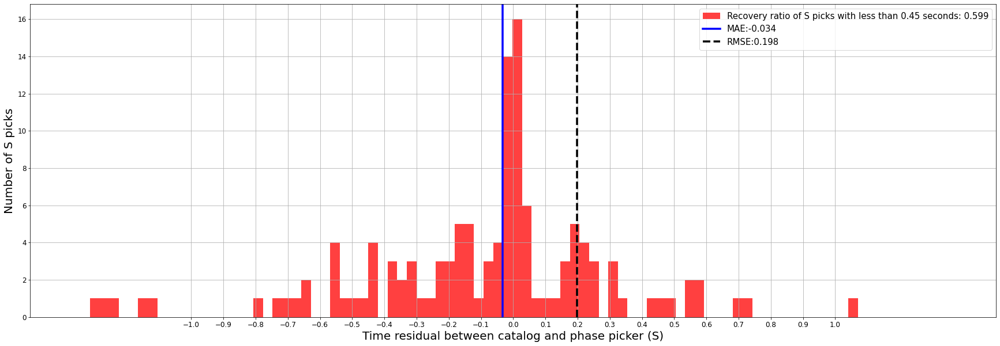

Traceback (most recent call last):
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/queues.py", line 251, in _feed
    send_bytes(obj)
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 205, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 409, in _send_bytes
    self._send(header)
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 373, in _send
    n = write(self._handle, buf)
BrokenPipeError: [Errno 32] Broken pipe
Traceback (most recent call last):
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/queues.py", line 251, in _feed
    send_bytes(obj)
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 205, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/home/javak/mi

In [ ]:
# Filter the time lag with the given threshold and capture the picks with more than .. second time lag
dists_filter_lag_time_m=all_dists_s[np.abs(all_dists_s) < 2000]/1000

# Perform S picks Quality control of PhaseNet by using existing S picks catalog with more than a given time lag
fig_lag_m, ax_lag_m = plt.subplots(figsize=(30,10))

label_more = '{0}{1}'.format('Recovery ratio of S picks with less than 0.45 seconds: ', round (all_dists_s[np.abs(all_dists_s) < time_lag_threshold].shape[0]/all_dists_s.shape[0],3))

n_lag_m, bins_lag_m, patches_lag_m = ax_lag_m.hist(dists_filter_lag_time_m, 100, density=False, facecolor='r', alpha=0.75, label=label_more)
#steps = (max(dists_filter_lag_time_m) - min(dists_filter_lag_time_m))/40
steps = 0.1
#plt.xticks(np.arange(min(dists_filter_lag_time_m), max(dists_filter_lag_time_m), step=steps))
plt.xticks(np.arange(-1, 1.1, step=steps))
plt.xlabel('Time residual between catalog and phase picker (S)', fontsize=20)
plt.ylabel('Number of S picks', fontsize=20)

plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

filter_tim_lag = all_dists_s[np.abs(all_dists_s) < 450]/1000
MAE = np.sum(filter_tim_lag)/filter_tim_lag.shape[0]
RMSE = np.sqrt (np.sum(filter_tim_lag**2)/filter_tim_lag.shape[0])
plt.axvline(MAE, color='blue', label='MAE:'+str(round (MAE,3)),linewidth=3.5)
plt.axvline(RMSE, color='black', label='RMSE:'+str(round (RMSE,3)), linestyle="--", linewidth=3.5)

#plt.title('Common S picks distribution with less than 2 seconds time residual (2012-01-01 to 2012-12-31)', fontsize=24, pad=23)
#plt.xlim(min(bins_lag_m), max(bins_lag_m))
plt.xlim([-1.5,1.5])
plt.grid(True)
plt.legend(loc='upper right', fontsize=15)
plt.show()



Traceback (most recent call last):
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/queues.py", line 251, in _feed
    send_bytes(obj)
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 205, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 409, in _send_bytes
    self._send(header)
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 373, in _send
    n = write(self._handle, buf)
BrokenPipeError: [Errno 32] Broken pipe
Traceback (most recent call last):
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/queues.py", line 251, in _feed
    send_bytes(obj)
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 205, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/home/javak/mi

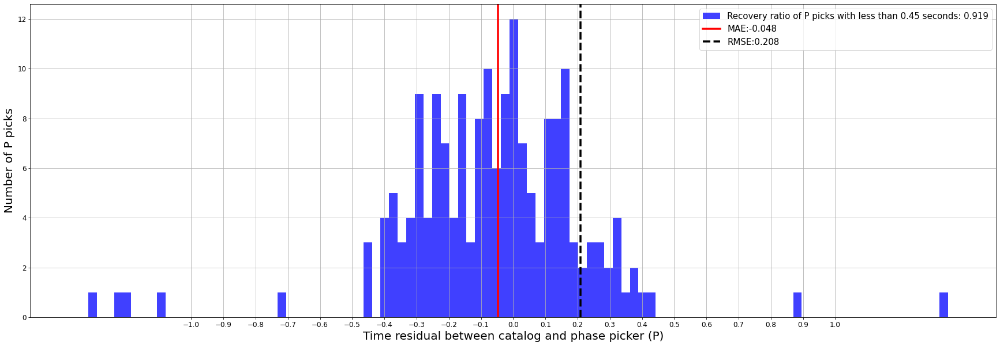

Traceback (most recent call last):
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/queues.py", line 251, in _feed
    send_bytes(obj)
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 205, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 409, in _send_bytes
    self._send(header)
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 373, in _send
    n = write(self._handle, buf)
BrokenPipeError: [Errno 32] Broken pipe
Traceback (most recent call last):
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/queues.py", line 251, in _feed
    send_bytes(obj)
  File "/home/javak/miniconda3/envs/seisbench/lib/python3.10/multiprocessing/connection.py", line 205, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/home/javak/mi

In [ ]:
# Filter the time lag with the given threshold and capture the picks with more than .. second time lag
dists_filter_lag_time_m=all_dists_p[np.abs(all_dists_p) < 2000]/1000

# Perform S picks Quality control of PhaseNet by using existing S picks catalog with more than a given time lag
fig_lag_m, ax_lag_m = plt.subplots(figsize=(30,10))

label_more = '{0}{1}'.format('Recovery ratio of P picks with less than 0.45 seconds: ', round (all_dists_p[np.abs(all_dists_p) < time_lag_threshold].shape[0]/all_dists_p.shape[0],3))

n_lag_m, bins_lag_m, patches_lag_m = ax_lag_m.hist(dists_filter_lag_time_m, 100, density=False, facecolor='blue', alpha=0.75, label=label_more)
#steps = (max(dists_filter_lag_time_m) - min(dists_filter_lag_time_m))/40
steps = 0.1
#plt.xticks(np.arange(min(dists_filter_lag_time_m), max(dists_filter_lag_time_m), step=steps))
plt.xticks(np.arange(-1, 1.1, step=steps))
plt.xlabel('Time residual between catalog and phase picker (P)', fontsize=20)
plt.ylabel('Number of P picks', fontsize=20)

plt.tick_params(axis='x', labelsize=12)
plt.tick_params(axis='y', labelsize=12)

filter_tim_lag = all_dists_p[np.abs(all_dists_p) < 450]/1000
MAE = np.sum(filter_tim_lag)/filter_tim_lag.shape[0]
RMSE = np.sqrt (np.sum(filter_tim_lag**2)/filter_tim_lag.shape[0])
plt.axvline(MAE, color='r', label='MAE:'+str(round (MAE,3)),linewidth=3.5)
plt.axvline(RMSE, color='black', label='RMSE:'+str(round (RMSE,3)), linestyle="--", linewidth=3.5)

#plt.title('Common S picks distribution with less than 2 seconds time residual (2012-01-01 to 2012-12-31)', fontsize=24, pad=23)
#plt.xlim(min(bins_lag_m), max(bins_lag_m))
plt.xlim([-1.5,1.5])
plt.grid(True)
plt.legend(loc='upper right', fontsize=15)
plt.show()

